In [1]:
from __future__ import print_function


### Remember to change the absolute path of the input audio

In [2]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

# and IPython.display for audio output
import IPython.display

# Librosa for audio
import librosa
# And the display module for visualization
import librosa.display

import mir_eval


In [3]:
# Define a function which wil apply a butterworth bandpass filter
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [4]:
audio_path = "D:\PycharmScratch_Git\PycharmScratch\Draft\system_simulation\BohemianRhapsody_cropped.wav"

In [5]:
y, sr = librosa.load(audio_path)


In [6]:
print(y.shape, sr)


(1141368,) 22050


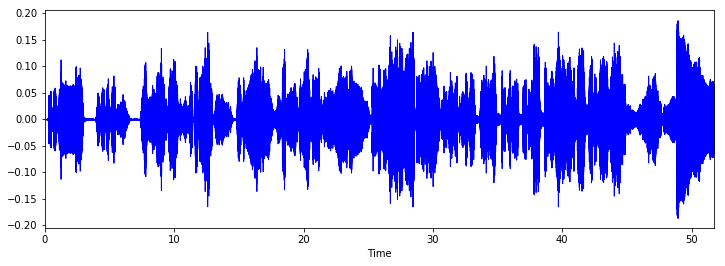

In [7]:
# Plot waveform
plt.figure(figsize=(12,4))
librosa.display.waveplot(y, sr, color='blue')


In [8]:
# Display widget for playing audio
IPython.display.Audio(data=y, rate=sr)


In [9]:
# Do some filtering, just for demonstration
signal_upper = butter_bandpass_filter(y, 1024, 7000, sr)
signal_lower = butter_bandpass_filter(y, 50, 1024, sr)

In [10]:
IPython.display.Audio(data=signal_upper, rate=sr)

In [11]:
IPython.display.Audio(data=signal_lower, rate=sr)

Text(0, 0.5, 'Magnitude')

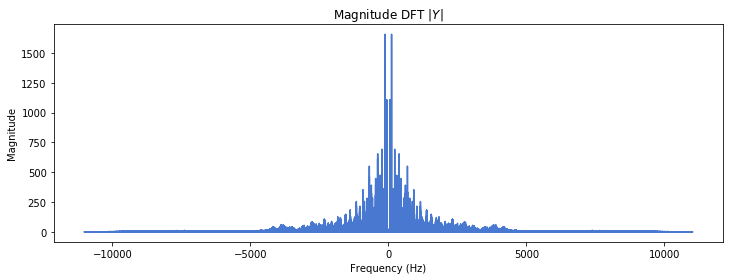

In [12]:
# Do some FFT
Y = np.fft.fft(y)
freq = np.fft.fftfreq(y.size, d=1/sr)

plt.figure(figsize=(12,4))
plt.plot(freq, np.abs(Y))
plt.title('Magnitude DFT $|Y|$'); plt.xlabel('Frequency (Hz)'); plt.ylabel('Magnitude') 


c:\users\totti\appdata\local\programs\python\python37-32\lib\site-packages\librosa\core\spectrum.py:983: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


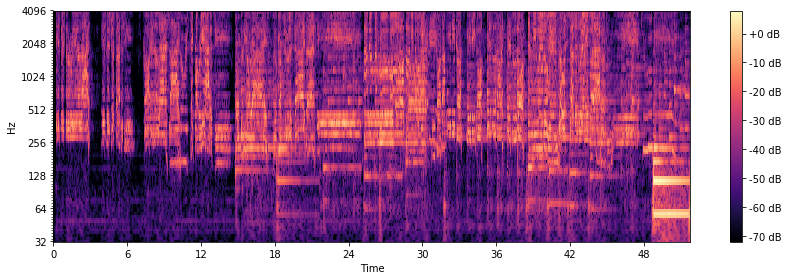

In [13]:
# Constant-Q transform (CQT)
C = librosa.cqt(y, sr)

plt.figure(figsize=(12,4))
librosa.display.specshow(librosa.amplitude_to_db(C), sr=sr, x_axis='time', y_axis='cqt_hz')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()


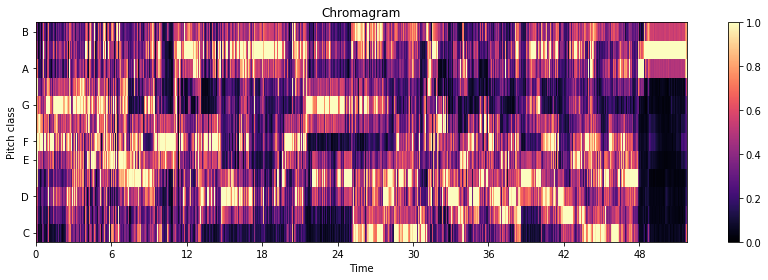

In [14]:
# CQT-based chromagram -> measure the energy in each pitch class
# Use the harmonic component to avoid pollution from transients
y_harmonic, y_percussive = librosa.effects.hpss(y)

C = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)

# Make a new figure
plt.figure(figsize=(12,4))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()


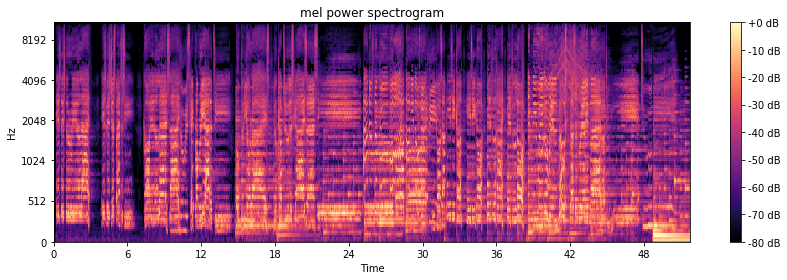

In [15]:
# MEL SPECTROGRAM
# Make and display a mel-scaled power (energy-squared) spectrogram
S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

# Convert to log scale (dB) using the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

# Make a new figure
plt.figure(figsize=(12,4))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')
plt.title('mel power spectrogram')

# Draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

c:\users\totti\appdata\local\programs\python\python37-32\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


<Figure size 864x432 with 0 Axes>

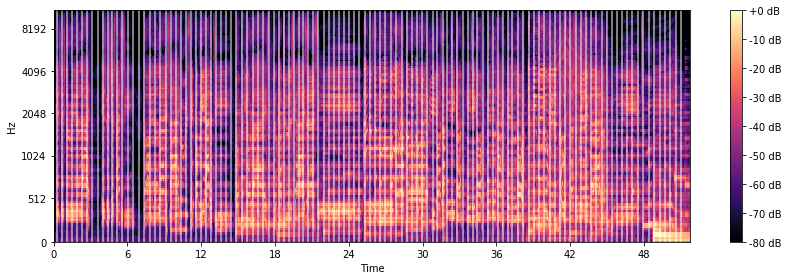

In [16]:
# Do some beat recognition (beat tracker)
# Use the percussive component for this part
plt.figure(figsize=(12, 6))
tempo, beats = librosa.beat.beat_track(y=y_percussive, sr=sr)

# Re-draw the spectrogram, but this time, overlay the detected beats
plt.figure(figsize=(12,4))
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

# Draw transparent lines over the beat frames
plt.vlines(librosa.frames_to_time(beats),
           1, 0.5 * sr,
           colors='w', linestyles='-', linewidth=2, alpha=0.5)

plt.axis('tight')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

In [17]:
# convert beats back to time domain
beat_times = librosa.frames_to_time(beats)
y_clicks = mir_eval.sonify.clicks(beat_times, sr, length=len(y))

In [18]:
# beats only
IPython.display.Audio(data=y_clicks, rate=sr)

In [19]:
# beats and audio
IPython.display.Audio(data=y+y_clicks, rate=sr)